In [ ]:
import os

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

import torch
from torch import nn
from torch.utils.data import DataLoader
import torchvision.transforms as transforms
from torchvision.transforms import ToTensor, InterpolationMode
import albumentations as A
from albumentations.pytorch import ToTensorV2

from dataset import HumanSegmentationDataset
from model import BackgroundRemoval
from loss import BCEDiceLoss, FocalDiceLoss
from utils import train_step, val_step, evaluate_thresholds, visualize_predictions

In [ ]:
if os.path.exists("/kaggle/input"):
    DATASET_ROOT = "/kaggle/input/datasets/tapakah68/supervisely-filtered-segmentation-person-dataset/supervisely_person_clean_2667_img/supervisely_person_clean_2667_img"
    CSV_ROOT = "/kaggle/input/datasets/tapakah68/supervisely-filtered-segmentation-person-dataset"
else:
    DATASET_ROOT = "./data/supervisely_person_clean_2667_img"
    CSV_ROOT = "./data"

try:
    os.listdir(DATASET_ROOT)
except FileNotFoundError:
    print(f"Dataset root {DATASET_ROOT} not found.")

['collage', 'images', 'masks']

In [40]:
IMAGE_SIZE = (256, 256)

image_transform = transforms.Compose([
    transforms.Resize(
    size=IMAGE_SIZE,
    interpolation=InterpolationMode.BILINEAR
    ),
    ToTensor(),
])

mask_transform = transforms.Compose([
    transforms.Resize(
    size=IMAGE_SIZE,
    interpolation=InterpolationMode.NEAREST
    ),
    ToTensor(),
])

In [4]:
IMAGE_SIZE = (384, 384)

# Training transforms WITH Data Augmentation
train_transform = A.Compose([
    A.Resize(height=IMAGE_SIZE[0], width=IMAGE_SIZE[1]),
    
    # Spatial augmentations (Applied to both image AND mask)
    A.HorizontalFlip(p=0.5),
    A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.1, rotate_limit=15, p=0.5),
    
    # Pixel-level augmentations (Applied ONLY to the image)
    A.RandomBrightnessContrast(p=0.3),
    A.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1, p=0.3),
    
    # Convert to PyTorch Tensors
    ToTensorV2(),
])

# Validation/Test transforms WITHOUT Augmentation (Only resize and to tensor)
val_transform = A.Compose([
    A.Resize(height=IMAGE_SIZE[0], width=IMAGE_SIZE[1]),
    ToTensorV2(),
])

/usr/local/lib/python3.12/dist-packages/albumentations/core/validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)


In [42]:
csv_path = os.path.join(
    CSV_ROOT,
    "df.csv"
)
df = pd.read_csv(csv_path)


dataset = HumanSegmentationDataset(df, DATASET_ROOT, val_transform)


In [43]:
image, mask = dataset[3]

print(image.shape)
print(mask.shape)
print(np.unique(np.array(mask)))

torch.Size([3, 256, 256])
torch.Size([256, 256])
[0. 1.]


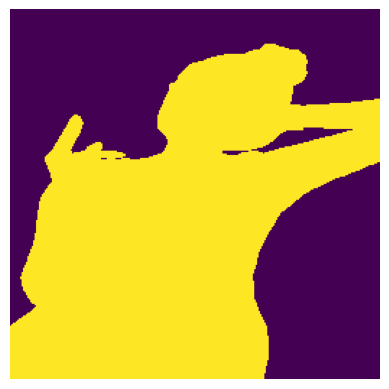

In [7]:
plt.imshow(mask.squeeze())
plt.axis("off")
plt.show()

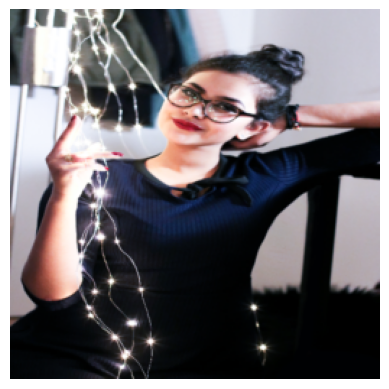

In [8]:
plt.imshow(image.permute(1, 2, 0).numpy())
plt.axis("off")
plt.show()

In [ ]:
csv_path = os.path.join(
    CSV_ROOT,
    "df.csv"
)
df = pd.read_csv(csv_path)

train_df, temp_df = train_test_split(df, test_size=0.20, random_state=42)

val_df, test_df = train_test_split(temp_df, test_size=0.50, random_state=42)

#Reset the index so iloc[] works correctly in Dataset class
train_df = train_df.reset_index(drop=True)
val_df = val_df.reset_index(drop=True)
test_df = test_df.reset_index(drop=True)


In [14]:
train_dataset = HumanSegmentationDataset(train_df, DATASET_ROOT, train_transform)
val_dataset = HumanSegmentationDataset(val_df, DATASET_ROOT, val_transform)
test_dataset = HumanSegmentationDataset(test_df, DATASET_ROOT, val_transform)

In [15]:
train_dataloader = DataLoader(train_dataset, batch_size=16, shuffle=True)
val_dataloader = DataLoader(val_dataset, batch_size=16, shuffle=False)
test_dataloader = DataLoader(test_dataset, batch_size=16, shuffle=False)

In [16]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [26]:
baseline_model = BackgroundRemoval().to(device)

criterion = nn.BCEWithLogitsLoss()

optimizer = torch.optim.Adam(
    baseline_model.parameters(),
    lr=1e-3
)

In [38]:
train_losses = []
val_losses = []
epochs = 25
best_iou = 0

for epoch in range(epochs):
    print(f"Epoch: {epoch+1}: ")
    train_loss = train_step(baseline_model, train_dataloader, criterion, optimizer, device)

    val_loss, val_iou, val_dice = val_step(baseline_model, val_dataloader, criterion, device)


    train_losses.append(train_loss)
    val_losses.append(val_loss)

    if val_iou > best_iou:
        best_iou = val_iou
        torch.save(
            {
                "epoch": epoch + 1,
                "model_state_dict": baseline_model.state_dict(),
                "optimizer_state_dict": optimizer.state_dict(),
                "train_losses": train_losses,
                "val_losses": val_losses,
                "val_iou": val_iou,
                "val_dice": val_dice,
            },
            "baseline_model.pth",
        )



Epoch: 1: 
Train loss: 0.48911
Val loss: 0.46904 | Val iou: 0.51096 | Val dice: 0.64834
Epoch: 2: 
Train loss: 0.39078
Val loss: 0.35501 | Val iou: 0.58711 | Val dice: 0.71438
Epoch: 3: 
Train loss: 0.34665
Val loss: 0.36824 | Val iou: 0.58011 | Val dice: 0.70911
Epoch: 4: 
Train loss: 0.32517
Val loss: 0.40471 | Val iou: 0.57633 | Val dice: 0.70157
Epoch: 5: 
Train loss: 0.29773
Val loss: 0.35108 | Val iou: 0.59982 | Val dice: 0.72212
Epoch: 6: 
Train loss: 0.27752
Val loss: 0.47077 | Val iou: 0.60640 | Val dice: 0.72770
Epoch: 7: 
Train loss: 0.26162
Val loss: 0.26381 | Val iou: 0.69107 | Val dice: 0.79486
Epoch: 8: 
Train loss: 0.24513
Val loss: 0.22615 | Val iou: 0.71552 | Val dice: 0.81188
Epoch: 9: 
Train loss: 0.22631
Val loss: 0.22757 | Val iou: 0.72545 | Val dice: 0.82137
Epoch: 10: 
Train loss: 0.21625
Val loss: 0.23091 | Val iou: 0.73624 | Val dice: 0.82957
Epoch: 11: 
Train loss: 0.20562
Val loss: 0.21503 | Val iou: 0.73893 | Val dice: 0.83205
Epoch: 12: 
Train loss: 0.2011

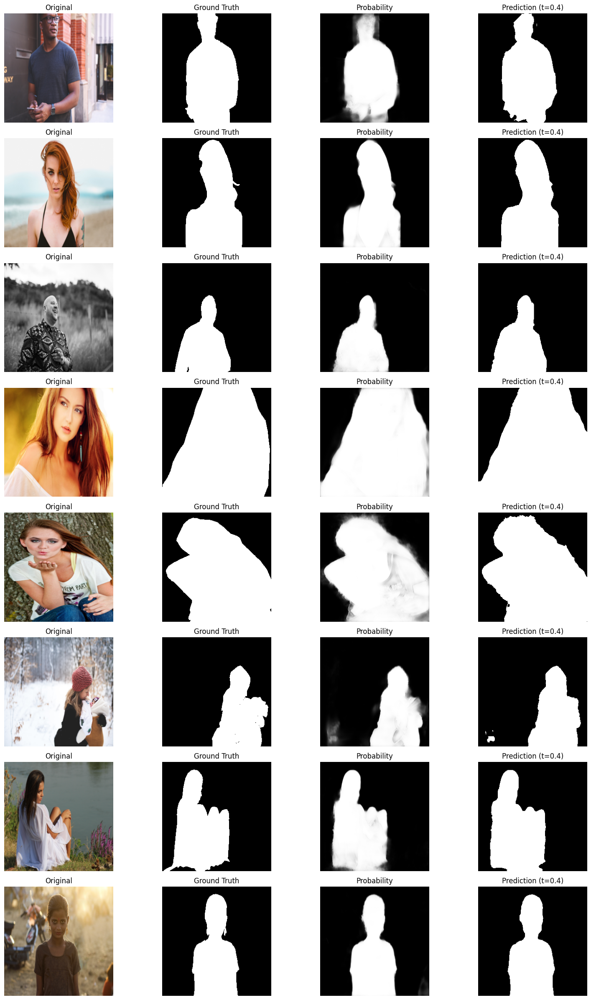

In [43]:
visualize_predictions(
    baseline_model,
    val_dataloader,
    device,
)

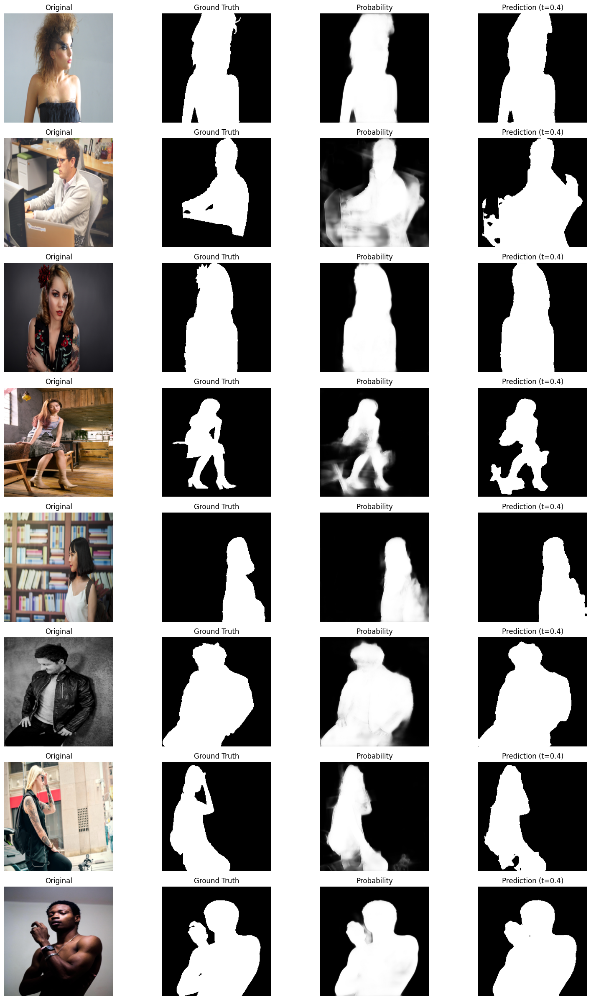

In [44]:
visualize_predictions(
    baseline_model,
    test_dataloader,
    device,
)

In [ ]:
evaluate_thresholds(baseline_model, val_dataloader, device)

### Second Try (BCE Dice loss)

In [31]:
second_model = BackgroundRemoval().to(device)

criterion = BCEDiceLoss()

optimizer = torch.optim.Adam(
    second_model.parameters(),
    lr=1e-3
)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='max', factor=0.5, patience=3
)

In [32]:
train_losses = []
val_losses = []
epochs = 40
best_iou = 0

for epoch in range(epochs):
    print(f"Epoch: {epoch+1}: ")
    train_loss = train_step(second_model, train_dataloader, criterion, optimizer, device)

    val_loss, val_iou, val_dice = val_step(second_model, val_dataloader, criterion, device)
    scheduler.step(val_iou)

    train_losses.append(train_loss)
    val_losses.append(val_loss)

    if val_iou > best_iou:
        best_iou = val_iou
        torch.save(
            {
                "epoch": epoch + 1,
                "model_state_dict": second_model.state_dict(),
                "optimizer_state_dict": optimizer.state_dict(),
                "train_losses": train_losses,
                "val_losses": val_losses,
                "val_iou": val_iou,
                "val_dice": val_dice,
            },
            "second_model.pth",
        )



Epoch: 1: 
Train loss: 0.49402
Val loss: 0.47417 | Val iou: 0.50398 | Val dice: 0.64251
Epoch: 2: 
Train loss: 0.40364
Val loss: 0.40550 | Val iou: 0.53774 | Val dice: 0.67317
Epoch: 3: 
Train loss: 0.35335
Val loss: 0.35134 | Val iou: 0.58815 | Val dice: 0.71541
Epoch: 4: 
Train loss: 0.33549
Val loss: 0.36276 | Val iou: 0.56119 | Val dice: 0.69029
Epoch: 5: 
Train loss: 0.30544
Val loss: 0.30842 | Val iou: 0.62469 | Val dice: 0.74461
Epoch: 6: 
Train loss: 0.28039
Val loss: 0.26648 | Val iou: 0.66485 | Val dice: 0.77603
Epoch: 7: 
Train loss: 0.26003
Val loss: 0.27803 | Val iou: 0.68199 | Val dice: 0.79040
Epoch: 8: 
Train loss: 0.24068
Val loss: 0.26376 | Val iou: 0.68372 | Val dice: 0.78723
Epoch: 9: 
Train loss: 0.22788
Val loss: 0.23148 | Val iou: 0.71103 | Val dice: 0.81084
Epoch: 10: 
Train loss: 0.21427
Val loss: 0.21019 | Val iou: 0.72448 | Val dice: 0.81914
Epoch: 11: 
Train loss: 0.19319
Val loss: 0.24117 | Val iou: 0.70854 | Val dice: 0.80266
Epoch: 12: 
Train loss: 0.1831

In [56]:
aug_model = BackgroundRemoval().to(device)

criterion = BCEDiceLoss()

optimizer = torch.optim.Adam(
    aug_model.parameters(),
    lr=1e-3
)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='max', factor=0.5, patience=3
)

In [57]:
train_losses = []
val_losses = []
epochs = 40
best_iou = 0

for epoch in range(epochs):
    print(f"Epoch: {epoch+1}: ")
    train_loss = train_step(aug_model, train_dataloader, criterion, optimizer, device)

    val_loss, val_iou, val_dice = val_step(aug_model, val_dataloader, criterion, device)
    scheduler.step(val_iou)

    train_losses.append(train_loss)
    val_losses.append(val_loss)

    if val_iou > best_iou:
        best_iou = val_iou
        torch.save(
            {
                "epoch": epoch + 1,
                "model_state_dict": aug_model.state_dict(),
                "optimizer_state_dict": optimizer.state_dict(),
                "train_losses": train_losses,
                "val_losses": val_losses,
                "val_iou": val_iou,
                "val_dice": val_dice,
            },
            "aug_model.pth",
        )



Epoch: 1: 
Train loss: 0.45643
Val loss: 0.40737 | Val iou: 0.53814 | Val dice: 0.66911
Epoch: 2: 
Train loss: 0.36602
Val loss: 0.40460 | Val iou: 0.53255 | Val dice: 0.66157
Epoch: 3: 
Train loss: 0.33681
Val loss: 0.35482 | Val iou: 0.55136 | Val dice: 0.66965
Epoch: 4: 
Train loss: 0.31281
Val loss: 0.34333 | Val iou: 0.56254 | Val dice: 0.68375
Epoch: 5: 
Train loss: 0.28920
Val loss: 0.33032 | Val iou: 0.59886 | Val dice: 0.71581
Epoch: 6: 
Train loss: 0.27203
Val loss: 0.26126 | Val iou: 0.66666 | Val dice: 0.77833
Epoch: 7: 
Train loss: 0.25513
Val loss: 0.22972 | Val iou: 0.70458 | Val dice: 0.80890
Epoch: 8: 
Train loss: 0.24750
Val loss: 0.22915 | Val iou: 0.69929 | Val dice: 0.79817
Epoch: 9: 
Train loss: 0.22844
Val loss: 0.26610 | Val iou: 0.69770 | Val dice: 0.79982
Epoch: 10: 
Train loss: 0.22033
Val loss: 0.19728 | Val iou: 0.74723 | Val dice: 0.83787
Epoch: 11: 
Train loss: 0.21734
Val loss: 0.24939 | Val iou: 0.69456 | Val dice: 0.79517
Epoch: 12: 
Train loss: 0.2063

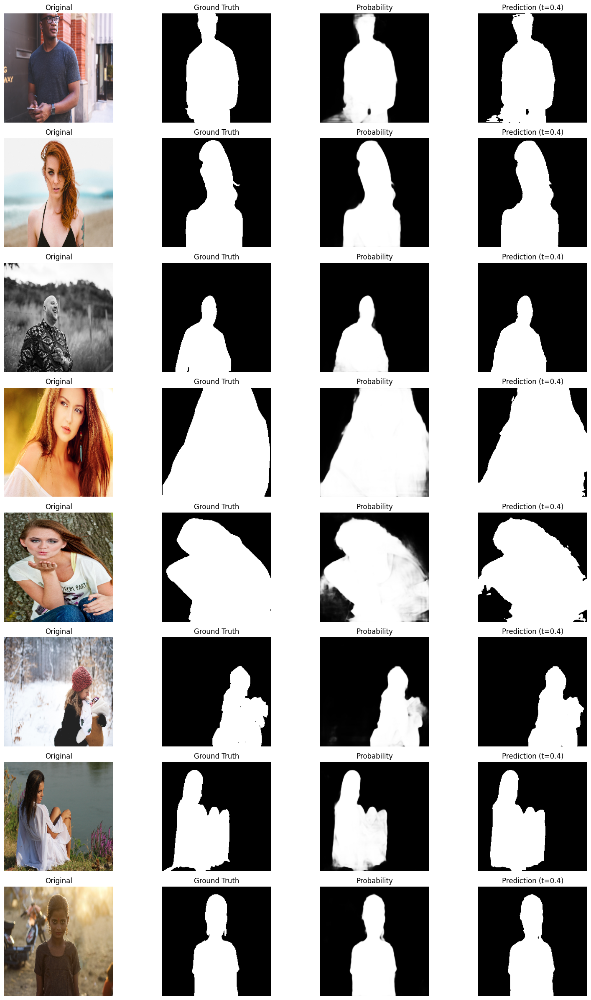

In [58]:
visualize_predictions(
    aug_model,
    val_dataloader,
    device,
)

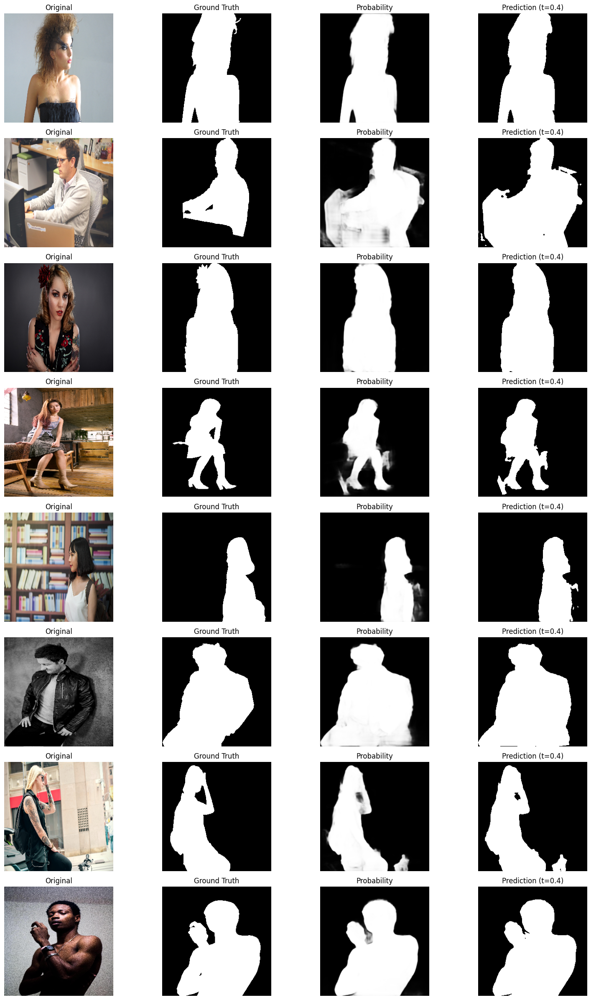

In [59]:
visualize_predictions(
    aug_model,
    test_dataloader,
    device,
)

In [65]:
input_size_model = BackgroundRemoval().to(device)

criterion = BCEDiceLoss()

optimizer = torch.optim.Adam(
    input_size_model.parameters(),
    lr=1e-3
)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='max', factor=0.5, patience=3
)

In [66]:
train_losses = []
val_losses = []
epochs = 50
best_iou = 0

for epoch in range(epochs):
    print(f"Epoch: {epoch+1}: ")
    train_loss = train_step(input_size_model, train_dataloader, criterion, optimizer, device)

    val_loss, val_iou, val_dice = val_step(input_size_model, val_dataloader, criterion, device)
    scheduler.step(val_iou)

    train_losses.append(train_loss)
    val_losses.append(val_loss)

    if val_iou > best_iou:
        best_iou = val_iou
        torch.save(
            {
                "epoch": epoch + 1,
                "model_state_dict": input_size_model.state_dict(),
                "optimizer_state_dict": optimizer.state_dict(),
                "scheduler_state_dict": scheduler.state_dict(),
                "train_losses": train_losses,
                "val_losses": val_losses,
                "val_iou": val_iou,
                "val_dice": val_dice,
            },
            "input_size_model.pth",
        )



Epoch: 1: 
Train loss: 0.51433
Val loss: 0.47243 | Val iou: 0.48134 | Val dice: 0.61763
Epoch: 2: 
Train loss: 0.42669
Val loss: 0.41723 | Val iou: 0.53913 | Val dice: 0.66914
Epoch: 3: 
Train loss: 0.37931
Val loss: 0.36261 | Val iou: 0.57116 | Val dice: 0.70349
Epoch: 4: 
Train loss: 0.35287
Val loss: 0.34473 | Val iou: 0.59634 | Val dice: 0.72049
Epoch: 5: 
Train loss: 0.32574
Val loss: 0.32275 | Val iou: 0.60568 | Val dice: 0.72764
Epoch: 6: 
Train loss: 0.30374
Val loss: 0.29429 | Val iou: 0.63735 | Val dice: 0.75222
Epoch: 7: 
Train loss: 0.28537
Val loss: 0.27279 | Val iou: 0.67739 | Val dice: 0.78598
Epoch: 8: 
Train loss: 0.26506
Val loss: 0.24012 | Val iou: 0.69492 | Val dice: 0.80057
Epoch: 9: 
Train loss: 0.25071
Val loss: 0.22848 | Val iou: 0.71407 | Val dice: 0.81509
Epoch: 10: 
Train loss: 0.23749
Val loss: 0.22388 | Val iou: 0.71824 | Val dice: 0.81777
Epoch: 11: 
Train loss: 0.22999
Val loss: 0.21349 | Val iou: 0.72544 | Val dice: 0.82425
Epoch: 12: 
Train loss: 0.2227

In [68]:
checkpoint = torch.load(
    "/kaggle/working/input_size_model.pth",
    map_location=device
)

input_size_model.load_state_dict(checkpoint["model_state_dict"])

<All keys matched successfully>

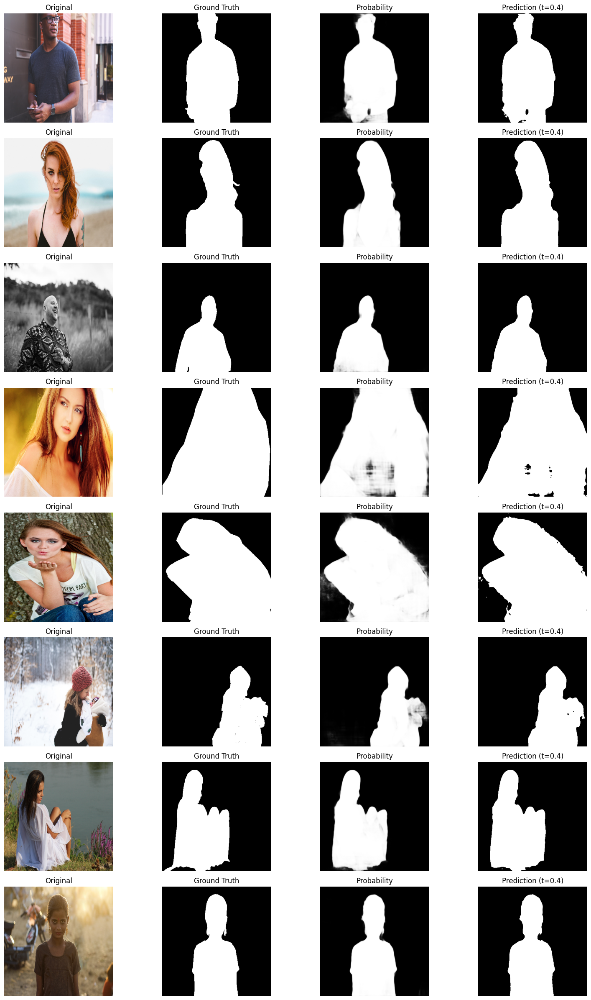

In [69]:
visualize_predictions(
    input_size_model,
    val_dataloader,
    device,
)

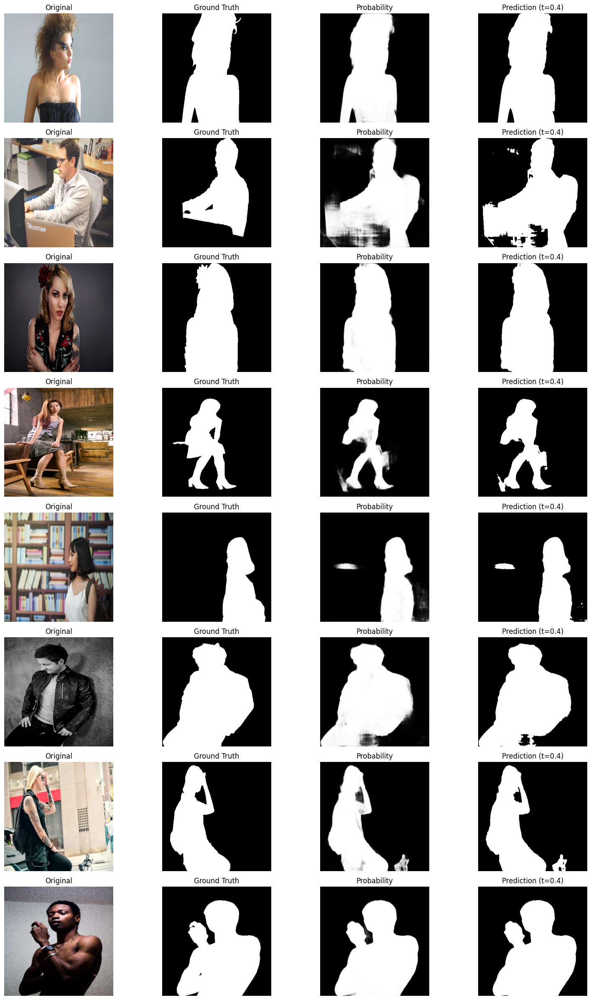

In [70]:
visualize_predictions(
    input_size_model,
    test_dataloader,
    device,
)

In [29]:
foc_model = BackgroundRemoval().to(device)

criterion = FocalDiceLoss()

optimizer = torch.optim.Adam(
    foc_model.parameters(),
    lr=1e-3
)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='max', factor=0.5, patience=3
)

In [30]:
train_losses = []
val_losses = []
epochs = 50
best_iou = 0

for epoch in range(epochs):
    print(f"Epoch: {epoch+1}: ")
    train_loss = train_step(foc_model, train_dataloader, criterion, optimizer, device)

    val_loss, val_iou, val_dice = val_step(foc_model, val_dataloader, criterion, device)
    scheduler.step(val_iou)

    train_losses.append(train_loss)
    val_losses.append(val_loss)

    if val_iou > best_iou:
        best_iou = val_iou
        torch.save(
            {
                "epoch": epoch + 1,
                "model_state_dict": foc_model.state_dict(),
                "optimizer_state_dict": optimizer.state_dict(),
                "scheduler_state_dict": scheduler.state_dict(),
                "train_losses": train_losses,
                "val_losses": val_losses,
                "val_iou": val_iou,
                "val_dice": val_dice,
            },
            "foc_model.pth",
        )



Epoch: 1: 
Train loss: 0.29111
Val loss: 0.26815 | Val iou: 0.49548 | Val dice: 0.63168
Epoch: 2: 
Train loss: 0.24967
Val loss: 0.24609 | Val iou: 0.55685 | Val dice: 0.68859
Epoch: 3: 
Train loss: 0.22446
Val loss: 0.23529 | Val iou: 0.56974 | Val dice: 0.69772
Epoch: 4: 
Train loss: 0.20441
Val loss: 0.19542 | Val iou: 0.61785 | Val dice: 0.74063
Epoch: 5: 
Train loss: 0.19110
Val loss: 0.16629 | Val iou: 0.66085 | Val dice: 0.77305
Epoch: 6: 
Train loss: 0.17618
Val loss: 0.15327 | Val iou: 0.68277 | Val dice: 0.78866
Epoch: 7: 
Train loss: 0.16406
Val loss: 0.21061 | Val iou: 0.62704 | Val dice: 0.74068
Epoch: 8: 
Train loss: 0.15884
Val loss: 0.17032 | Val iou: 0.63281 | Val dice: 0.73996
Epoch: 9: 
Train loss: 0.14643
Val loss: 0.13794 | Val iou: 0.70067 | Val dice: 0.80244
Epoch: 10: 
Train loss: 0.14085
Val loss: 0.12463 | Val iou: 0.73265 | Val dice: 0.82559
Epoch: 11: 
Train loss: 0.13778
Val loss: 0.12125 | Val iou: 0.74062 | Val dice: 0.83162
Epoch: 12: 
Train loss: 0.1340

In [32]:
checkpoint = torch.load(
    "/kaggle/working/foc_model.pth",
    map_location=device
)

foc_model.load_state_dict(checkpoint["model_state_dict"])

<All keys matched successfully>

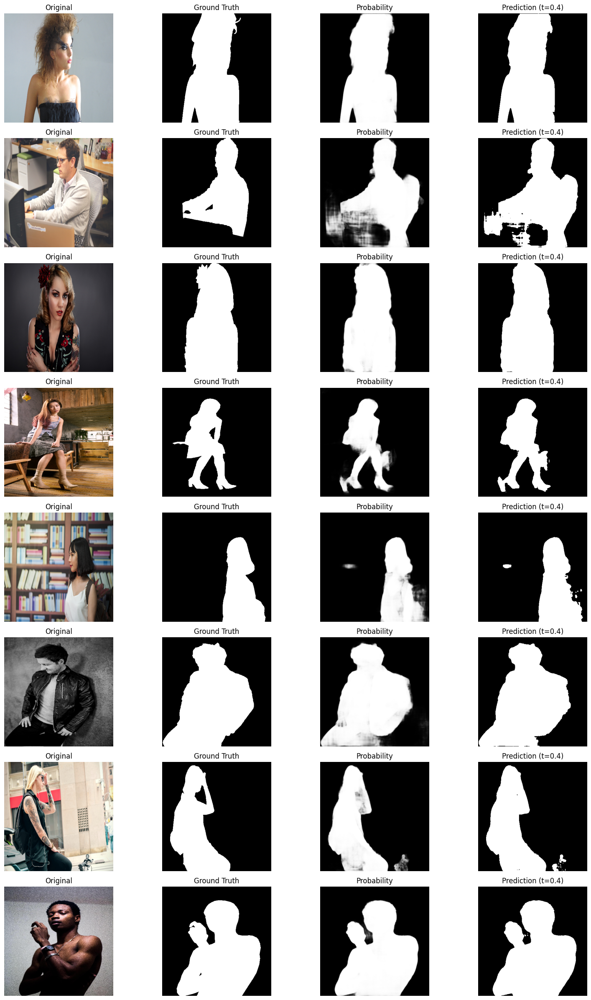

In [33]:
visualize_predictions(
    foc_model,
    test_dataloader,
    device,
)

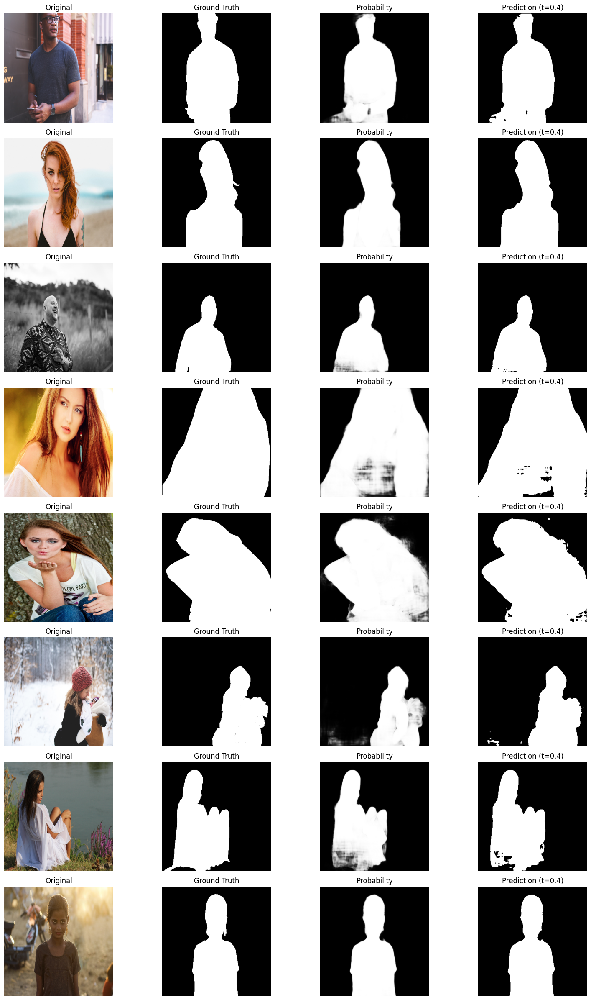

In [34]:
visualize_predictions(
    foc_model,
    val_dataloader,
    device,
)

In [44]:
res_model = BackgroundRemoval().to(device)

criterion = FocalDiceLoss()

optimizer = torch.optim.Adam(
    res_model.parameters(),
    lr=1e-3
)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='max', factor=0.5, patience=3
)

In [45]:
train_losses = []
val_losses = []
epochs = 50
best_iou = 0

for epoch in range(epochs):
    print(f"Epoch: {epoch+1}: ")
    train_loss = train_step(res_model, train_dataloader, criterion, optimizer, device)

    val_loss, val_iou, val_dice = val_step(res_model, val_dataloader, criterion, device)
    scheduler.step(val_iou)

    train_losses.append(train_loss)
    val_losses.append(val_loss)

    if val_iou > best_iou:
        best_iou = val_iou
        torch.save(
            {
                "epoch": epoch + 1,
                "model_state_dict": res_model.state_dict(),
                "optimizer_state_dict": optimizer.state_dict(),
                "scheduler_state_dict": scheduler.state_dict(),
                "train_losses": train_losses,
                "val_losses": val_losses,
                "val_iou": val_iou,
                "val_dice": val_dice,
            },
            "res_model.pth",
        )



Epoch: 1: 
Train loss: 0.29463
Val loss: 0.25828 | Val iou: 0.51094 | Val dice: 0.64511
Epoch: 2: 
Train loss: 0.24593
Val loss: 0.33105 | Val iou: 0.41021 | Val dice: 0.54331
Epoch: 3: 
Train loss: 0.22836
Val loss: 0.27256 | Val iou: 0.50300 | Val dice: 0.63702
Epoch: 4: 
Train loss: 0.20622
Val loss: 0.19304 | Val iou: 0.60649 | Val dice: 0.72973
Epoch: 5: 
Train loss: 0.19185
Val loss: 0.18546 | Val iou: 0.64027 | Val dice: 0.75726
Epoch: 6: 
Train loss: 0.17821
Val loss: 0.16318 | Val iou: 0.66422 | Val dice: 0.77543
Epoch: 7: 
Train loss: 0.16465
Val loss: 0.14682 | Val iou: 0.68762 | Val dice: 0.79100
Epoch: 8: 
Train loss: 0.15158
Val loss: 0.14891 | Val iou: 0.69632 | Val dice: 0.80034
Epoch: 9: 
Train loss: 0.14636
Val loss: 0.13463 | Val iou: 0.72233 | Val dice: 0.81930
Epoch: 10: 
Train loss: 0.13868
Val loss: 0.12819 | Val iou: 0.72933 | Val dice: 0.82474
Epoch: 11: 
Train loss: 0.13707
Val loss: 0.12280 | Val iou: 0.74881 | Val dice: 0.84219
Epoch: 12: 
Train loss: 0.1273

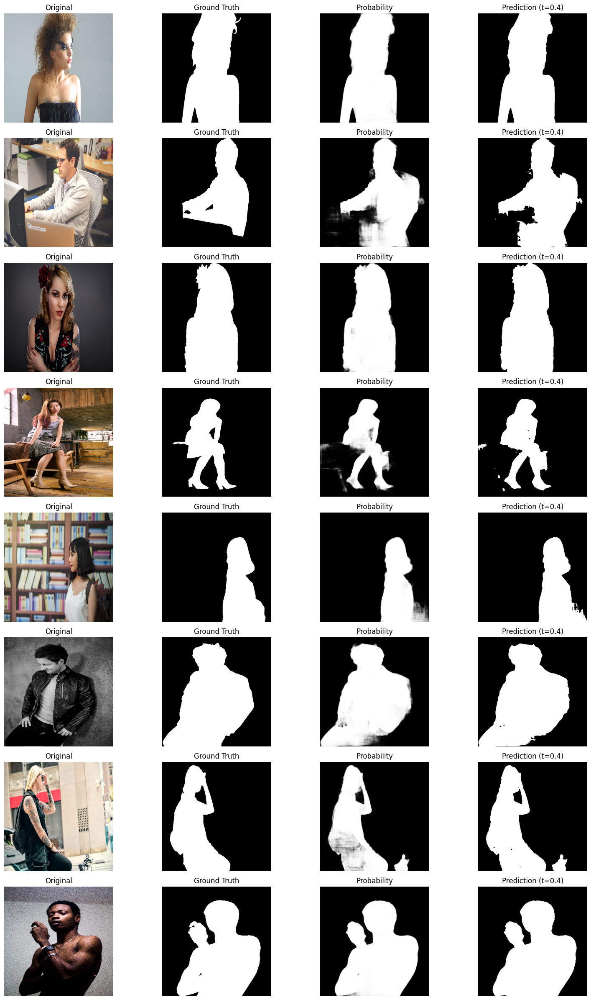

In [46]:
visualize_predictions(
    res_model,
    test_dataloader,
    device,
)

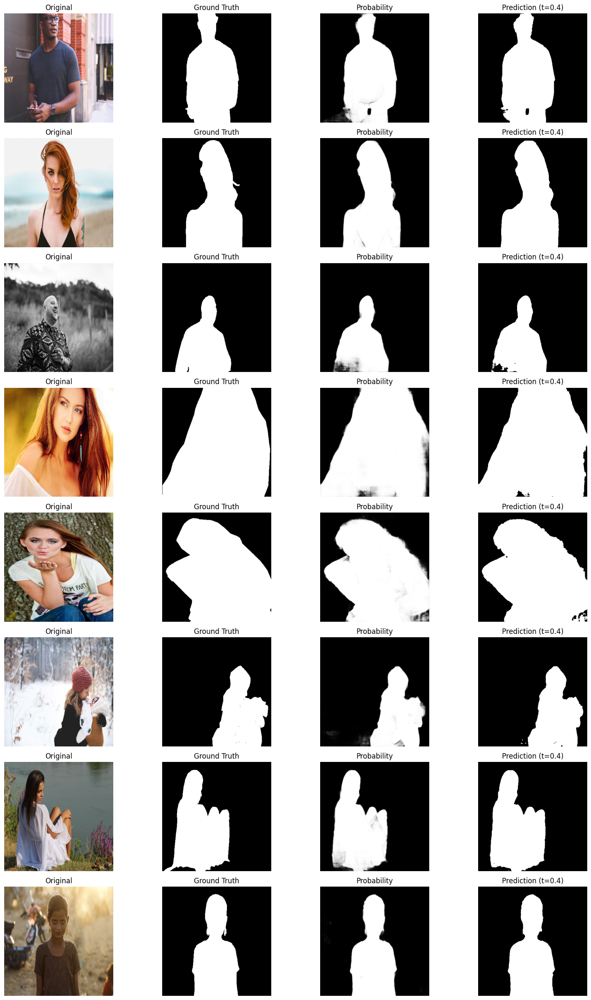

In [49]:
visualize_predictions(
    res_model,
    val_dataloader,
    device,
)

In [24]:
adamW_model = BackgroundRemoval().to(device)

criterion = FocalDiceLoss()

optimizer = torch.optim.AdamW(
    adamW_model.parameters(), 
    lr=1e-3,
    weight_decay=1e-4  
)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='max', factor=0.5, patience=3
)

In [25]:
train_losses = []
val_losses = []
epochs = 50
best_iou = 0

for epoch in range(epochs):
    print(f"Epoch: {epoch+1}: ")
    train_loss = train_step(adamW_model, train_dataloader, criterion, optimizer, device)

    val_loss, val_iou, val_dice = val_step(adamW_model, val_dataloader, criterion, device)
    scheduler.step(val_iou)

    train_losses.append(train_loss)
    val_losses.append(val_loss)

    if val_iou > best_iou:
        best_iou = val_iou
        torch.save(
            {
                "epoch": epoch + 1,
                "model_state_dict": adamW_model.state_dict(),
                "optimizer_state_dict": optimizer.state_dict(),
                "scheduler_state_dict": scheduler.state_dict(),
                "train_losses": train_losses,
                "val_losses": val_losses,
                "val_iou": val_iou,
                "val_dice": val_dice,
            },
            "adamW_model.pth",
        )



Epoch: 1: 
Train loss: 0.29536
Val loss: 0.30294 | Val iou: 0.41370 | Val dice: 0.55223
Epoch: 2: 
Train loss: 0.26193
Val loss: 0.25723 | Val iou: 0.54642 | Val dice: 0.67645
Epoch: 3: 
Train loss: 0.23349
Val loss: 0.27678 | Val iou: 0.53152 | Val dice: 0.65940
Epoch: 4: 
Train loss: 0.21467
Val loss: 0.20898 | Val iou: 0.59076 | Val dice: 0.72058
Epoch: 5: 
Train loss: 0.20075
Val loss: 0.21333 | Val iou: 0.60565 | Val dice: 0.73017
Epoch: 6: 
Train loss: 0.18498
Val loss: 0.17343 | Val iou: 0.65715 | Val dice: 0.76716
Epoch: 7: 
Train loss: 0.17600
Val loss: 0.19898 | Val iou: 0.63921 | Val dice: 0.75199
Epoch: 8: 
Train loss: 0.16406
Val loss: 0.16356 | Val iou: 0.68980 | Val dice: 0.79424
Epoch: 9: 
Train loss: 0.15364
Val loss: 0.13674 | Val iou: 0.71777 | Val dice: 0.81482
Epoch: 10: 
Train loss: 0.14681
Val loss: 0.12894 | Val iou: 0.72404 | Val dice: 0.82164
Epoch: 11: 
Train loss: 0.13851
Val loss: 0.12420 | Val iou: 0.73303 | Val dice: 0.82572
Epoch: 12: 
Train loss: 0.1328

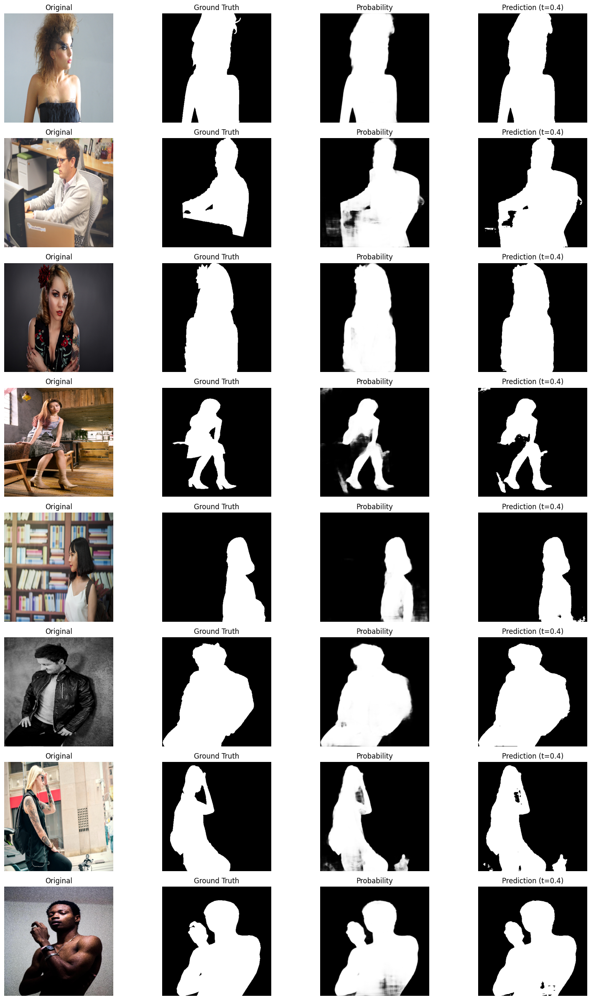

In [26]:
visualize_predictions(
    adamW_model,
    test_dataloader,
    device,
)

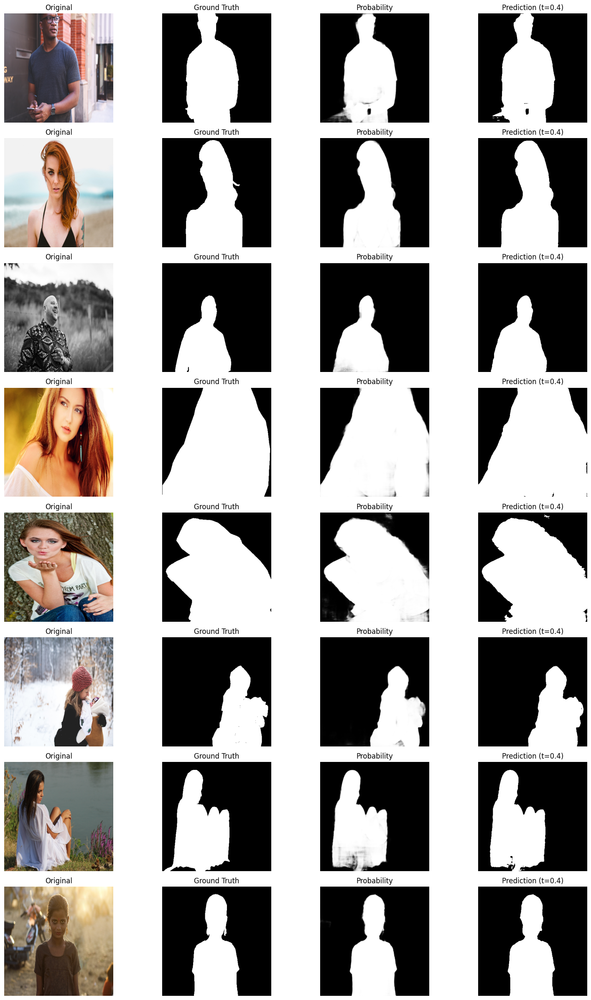

In [27]:
visualize_predictions(
    adamW_model,
    val_dataloader,
    device,
)